### NCDC WEB SCRAPE

In [2]:
import pandas as pd
import datetime as dt
import numpy as np
import requests
import urllib.request
import csv
from bs4 import BeautifulSoup
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')

In [3]:
url = 'https://covid19.ncdc.gov.ng'
dfs = pd.read_html(url)
ncdc = dfs[0]

In [4]:
ncdc.head()

,States Affected,No. of Cases (Lab Confirmed),No. of Cases (on admission),No. Discharged,No. of Deaths
0,Lagos,59987,1016,58515,456
1,FCT,19904,185,19552,167
2,Kaduna,9126,15,9046,65
3,Plateau,9068,5,9006,57
4,Rivers,7351,40,7210,101


### John Hopkins Data Repository

In [5]:
url1 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/06e37b437cb069c770c56b0aea1724d85279ba92/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
global_confirmed = pd.read_csv(url1)

In [6]:
url2 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/06e37b437cb069c770c56b0aea1724d85279ba92/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
global_recovered = pd.read_csv(url2)

In [7]:
url3 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/06e37b437cb069c770c56b0aea1724d85279ba92/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
global_deaths = pd.read_csv(url3)

### External Data

In [8]:
budget_data = pd.read_csv('Budget data.csv')
covid_ex = pd.read_csv('covid_external.csv')
covidnig = pd.read_csv('covidnig.csv')
realgdp = pd.read_csv('RealGDP.csv') 

### DATA VIEWING AND CLEANING

In [9]:
global_confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,65080,65486,65728,66275,66903,67743,68366,69130,70111,70761
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132153,132176,132209,132215,132229,132244,132264,132285,132297,132309
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,126434,126651,126860,127107,127361,127646,127926,128198,128456,128725
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13569,13569,13569,13569,13664,13671,13682,13693,13693,13693
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,31909,32149,32441,32623,32933,33338,33607,33944,34180,34366


In [10]:
global_confirmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276 entries, 0 to 275
Columns: 499 entries, Province/State to 5/30/21
dtypes: float64(2), int64(495), object(2)
memory usage: 1.1+ MB


In [11]:
global_recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,55790,55889,56035,56295,56518,56711,56962,57119,57281,57450
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,128425,128601,128732,128826,128907,128978,129042,129097,129215,129308
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,88066,88208,88346,88497,88672,88861,89040,89232,89419,89625
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13234,13234,13234,13234,13263,13381,13405,13416,13416,13416
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,26513,26775,26778,27087,27204,27467,27529,27577,27646,27766


In [12]:
global_recovered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 261 entries, 0 to 260
Columns: 499 entries, Province/State to 5/30/21
dtypes: float64(2), int64(495), object(2)
memory usage: 1017.6+ KB


In [13]:
global_deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,2782,2792,2802,2812,2836,2855,2869,2881,2899,2919
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2441,2442,2444,2445,2447,2447,2447,2448,2449,2450
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,3405,3411,3418,3426,3433,3440,3448,3455,3460,3465
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,127,127,127,127,127,127,127,127,127,127
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,709,715,725,731,735,742,745,749,757,764


In [14]:
global_deaths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276 entries, 0 to 275
Columns: 499 entries, Province/State to 5/30/21
dtypes: float64(2), int64(495), object(2)
memory usage: 1.1+ MB


In [15]:
budget_data.head()

,states,Initial_budget (Bn),Revised_budget (Bn)
0,Abia,136.60,102.70
1,Adamawa,183.30,139.31
2,Akwa-Ibom,597.73,366.00
3,Anambra,137.10,112.80
4,Bauchi,167.20,128.00


In [16]:
budget_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   states               37 non-null     object 
 1   Initial_budget (Bn)  37 non-null     float64
 2   Revised_budget (Bn)  37 non-null     float64
dtypes: float64(2), object(1)
memory usage: 1016.0+ bytes


In [17]:
covid_ex.head()

,states,region,Population,Overall CCVI Index,Age,Epidemiological,Fragility,Health System,Population Density,Socio-Economic,Transport Availability,Acute IHR
0,FCT,North Central,4865000,0.3,0.0,0.9,0.4,0.6,0.9,0.6,0.2,0.79
1,Plateau,North Central,4766000,0.4,0.5,0.4,0.8,0.3,0.3,0.5,0.3,0.93
2,Kwara,North Central,3524000,0.3,0.4,0.3,0.2,0.4,0.2,0.6,0.7,0.93
3,Nassarawa,North Central,2783000,0.1,0.3,0.5,0.9,0.0,0.1,0.6,0.5,0.85
4,Niger,North Central,6260000,0.6,0.0,0.6,0.3,0.7,0.1,0.8,0.8,0.84


In [18]:
covid_ex.rename(columns = {'states':'States Affected'}, inplace = True)

In [19]:
covid_ex.head(2)

,States Affected,region,Population,Overall CCVI Index,Age,Epidemiological,Fragility,Health System,Population Density,Socio-Economic,Transport Availability,Acute IHR
0,FCT,North Central,4865000,0.3,0.0,0.9,0.4,0.6,0.9,0.6,0.2,0.79
1,Plateau,North Central,4766000,0.4,0.5,0.4,0.8,0.3,0.3,0.5,0.3,0.93


In [20]:
covid_ex.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   States Affected          37 non-null     object 
 1   region                   37 non-null     object 
 2   Population               37 non-null     int64  
 3   Overall CCVI Index       37 non-null     float64
 4   Age                      37 non-null     float64
 5   Epidemiological          37 non-null     float64
 6   Fragility                37 non-null     float64
 7   Health System            37 non-null     float64
 8   Population Density       37 non-null     float64
 9   Socio-Economic           37 non-null     float64
 10   Transport Availability  37 non-null     float64
 11  Acute IHR                37 non-null     float64
dtypes: float64(9), int64(1), object(2)
memory usage: 3.6+ KB


In [21]:
covidnig.head()

,States Affected,No. of Cases (Lab Confirmed),No. of Cases (on admission),No. Discharged,No. of Deaths
0,Lagos,"26,708","2,435","24,037",236
1,FCT,"9,627","2,840","6,694",93
2,Kaduna,"4,504",579,"3,877",48
3,Plateau,"4,262",280,"3,948",34
4,Oyo,"3,788",368,"3,374",46


In [22]:
covidnig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   States Affected               37 non-null     object
 1   No. of Cases (Lab Confirmed)  37 non-null     object
 2   No. of Cases (on admission)   37 non-null     object
 3   No. Discharged                37 non-null     object
 4   No. of Deaths                 37 non-null     int64 
dtypes: int64(1), object(4)
memory usage: 1.6+ KB


In [23]:
covidnig.rename(columns = {'No. of Cases (Lab Confirmed)' : 'Confirmed Cases', 'No. of Cases (on admission)': 'Admitted', 'No. Discharged': 'Discharged', 'No. of Deaths': 'Deaths'}, inplace= True)

In [24]:
covidnig.head()

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,"26,708","2,435","24,037",236
1,FCT,"9,627","2,840","6,694",93
2,Kaduna,"4,504",579,"3,877",48
3,Plateau,"4,262",280,"3,948",34
4,Oyo,"3,788",368,"3,374",46


In [25]:
covidnig['Confirmed Cases']= covidnig['Confirmed Cases'].str.replace(',','').astype(int)

In [26]:
covidnig['Admitted']= covidnig['Admitted'].str.replace(',','').astype(int)

In [27]:
covidnig['Discharged']= covidnig['Discharged'].str.replace(',','').astype(int)

In [28]:
covidnig.head()

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,26708,2435,24037,236
1,FCT,9627,2840,6694,93
2,Kaduna,4504,579,3877,48
3,Plateau,4262,280,3948,34
4,Oyo,3788,368,3374,46


In [29]:
realgdp.head()

,Year,Q1,Q2,Q3,Q4
0,2014,15438679.50,16084622.31,17479127.58,18150356.45
1,2015,16050601.38,16463341.91,17976234.59,18533752.07
2,2016,15943714.54,16218542.41,17555441.69,18213537.29
3,2017,15797965.83,16334719.27,17760228.17,18598067.07
4,2018,16096654.19,16580508.07,18081342.10,19041437.59


In [30]:
realgdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    7 non-null      int64  
 1   Q1      7 non-null      float64
 2   Q2      7 non-null      float64
 3   Q3      7 non-null      float64
 4   Q4      7 non-null      float64
dtypes: float64(4), int64(1)
memory usage: 408.0 bytes


In [31]:
realgdp['Year'] = pd.to_datetime(realgdp['Year'])

In [32]:
realgdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Year    7 non-null      datetime64[ns]
 1   Q1      7 non-null      float64       
 2   Q2      7 non-null      float64       
 3   Q3      7 non-null      float64       
 4   Q4      7 non-null      float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 408.0 bytes


In [33]:
realgdp

,Year,Q1,Q2,Q3,Q4
0,1970-01-01 00:00:00.000002014,15438679.50,16084622.31,17479127.58,18150356.45
1,1970-01-01 00:00:00.000002015,16050601.38,16463341.91,17976234.59,18533752.07
2,1970-01-01 00:00:00.000002016,15943714.54,16218542.41,17555441.69,18213537.29
3,1970-01-01 00:00:00.000002017,15797965.83,16334719.27,17760228.17,18598067.07
4,1970-01-01 00:00:00.000002018,16096654.19,16580508.07,18081342.10,19041437.59
5,1970-01-01 00:00:00.000002019,16434552.65,16931434.89,18494114.17,19530000.00
6,1970-01-01 00:00:00.000002020,16740000.00,15890000.00,17820000.00,0.00


In [34]:
realgdp['Year'] = realgdp['Year'].astype(str)

In [35]:
realgdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    7 non-null      object 
 1   Q1      7 non-null      float64
 2   Q2      7 non-null      float64
 3   Q3      7 non-null      float64
 4   Q4      7 non-null      float64
dtypes: float64(4), object(1)
memory usage: 408.0+ bytes


In [36]:
realgdp.iloc[0,0]= realgdp.iloc[0,0].replace('1970-01-01 00:00:00.000002014','2014')
realgdp.iloc[1,0]= realgdp.iloc[1,0].replace('1970-01-01 00:00:00.000002015','2015')
realgdp.iloc[2,0]= realgdp.iloc[2,0].replace('1970-01-01 00:00:00.000002016','2016')
realgdp.iloc[3,0]= realgdp.iloc[3,0].replace('1970-01-01 00:00:00.000002017','2017')
realgdp.iloc[4,0]= realgdp.iloc[4,0].replace('1970-01-01 00:00:00.000002018','2018')
realgdp.iloc[5,0]= realgdp.iloc[5,0].replace('1970-01-01 00:00:00.000002019','2019')
realgdp.iloc[6,0]= realgdp.iloc[6,0].replace('1970-01-01 00:00:00.000002020','2020')

In [37]:
realgdp

,Year,Q1,Q2,Q3,Q4
0,2014,15438679.50,16084622.31,17479127.58,18150356.45
1,2015,16050601.38,16463341.91,17976234.59,18533752.07
2,2016,15943714.54,16218542.41,17555441.69,18213537.29
3,2017,15797965.83,16334719.27,17760228.17,18598067.07
4,2018,16096654.19,16580508.07,18081342.10,19041437.59
5,2019,16434552.65,16931434.89,18494114.17,19530000.00
6,2020,16740000.00,15890000.00,17820000.00,0.00


In [38]:
realgdp['Year']= pd.to_datetime(realgdp['Year'])

In [39]:
realgdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Year    7 non-null      datetime64[ns]
 1   Q1      7 non-null      float64       
 2   Q2      7 non-null      float64       
 3   Q3      7 non-null      float64       
 4   Q4      7 non-null      float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 408.0 bytes


In [40]:
realgdp

,Year,Q1,Q2,Q3,Q4
0,2014-01-01,15438679.50,16084622.31,17479127.58,18150356.45
1,2015-01-01,16050601.38,16463341.91,17976234.59,18533752.07
2,2016-01-01,15943714.54,16218542.41,17555441.69,18213537.29
3,2017-01-01,15797965.83,16334719.27,17760228.17,18598067.07
4,2018-01-01,16096654.19,16580508.07,18081342.10,19041437.59
5,2019-01-01,16434552.65,16931434.89,18494114.17,19530000.00
6,2020-01-01,16740000.00,15890000.00,17820000.00,0.00


TODO B

In [41]:
Nigeria_daily_confirmed = global_confirmed.loc[(global_confirmed['Country/Region'] == 'Nigeria')]

In [42]:
Nigeria_daily_confirmed

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
201,NaN,Nigeria,9.082,8.6753,0,0,0,0,0,0,...,165944,165979,166019,166061,166098,166146,166191,166254,166285,166315


In [43]:
# tdcn --> total daily confirmed Nigeria

tdcn = Nigeria_daily_confirmed.drop(Nigeria_daily_confirmed.iloc[:, 0:4], axis = 1)

In [44]:
tdcn

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
201,0,0,0,0,0,0,0,0,0,0,...,165944,165979,166019,166061,166098,166146,166191,166254,166285,166315


In [45]:
tdcn_plot = tdcn.melt(var_name = 'Dates', value_name = 'Confirmed')

In [46]:
tdcn_plot

,Dates,Confirmed
0,1/22/20,0
1,1/23/20,0
2,1/24/20,0
3,1/25/20,0
4,1/26/20,0
...,...,...
490,5/26/21,166146
491,5/27/21,166191
492,5/28/21,166254
493,5/29/21,166285


In [47]:
Nigeria_daily_recovery = global_recovered.loc[(global_recovered['Country/Region'] == 'Nigeria')]

In [48]:
Nigeria_daily_recovery

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
186,NaN,Nigeria,9.082,8.6753,0,0,0,0,0,0,...,156462,156468,156476,156492,156528,156529,156535,156546,156557,156558


In [49]:
Nigeria_daily_recovery.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 186 to 186
Columns: 499 entries, Province/State to 5/30/21
dtypes: float64(2), int64(495), object(2)
memory usage: 3.9+ KB


In [50]:
# tdrn --> total daily recovery Nigeria

tdrn = Nigeria_daily_recovery.drop(Nigeria_daily_recovery.iloc[:,0:4], axis = 1)

In [51]:
tdrn_plot = tdrn.melt(var_name = 'Dates', value_name = 'Recovery')

In [52]:
tdrn_plot.tail()

,Dates,Recovery
490,5/26/21,156529
491,5/27/21,156535
492,5/28/21,156546
493,5/29/21,156557
494,5/30/21,156558


In [53]:
Nigeria_daily_deaths = global_deaths.loc[(global_deaths['Country/Region'] == 'Nigeria')]

In [54]:
Nigeria_daily_deaths

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
201,NaN,Nigeria,9.082,8.6753,0,0,0,0,0,0,...,2067,2067,2067,2067,2071,2071,2071,2071,2071,2071


In [55]:
# tddn --> total daily deaths Nigeria

tddn = Nigeria_daily_deaths.drop(Nigeria_daily_deaths.iloc[:,0:4], axis = 1)

In [56]:
tddn_plot = tddn.melt(var_name = 'Dates', value_name = 'Deaths')

In [57]:
tddn_plot.tail()

,Dates,Deaths
490,5/26/21,2071
491,5/27/21,2071
492,5/28/21,2071
493,5/29/21,2071
494,5/30/21,2071


### ANALYSIS

TODO 

In [58]:
covidnig.describe()

,Confirmed Cases,Admitted,Discharged,Deaths
count,37.000000,37.000000,37.000000,37.000000
mean,2119.837838,240.810811,1846.027027,33.000000
std,4537.417740,595.255773,4009.464785,41.797794
min,5.000000,0.000000,3.000000,2.000000
25%,381.000000,25.000000,300.000000,11.000000
50%,897.000000,57.000000,775.000000,21.000000
75%,1843.000000,183.000000,1737.000000,36.000000
max,26708.000000,2840.000000,24037.000000,236.000000


In [59]:
covidnig.head()

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,26708,2435,24037,236
1,FCT,9627,2840,6694,93
2,Kaduna,4504,579,3877,48
3,Plateau,4262,280,3948,34
4,Oyo,3788,368,3374,46


In [60]:
plot_data1 = covidnig.sort_values(by= 'Confirmed Cases', ascending= False).head(10)

In [61]:
plot_data1

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,26708,2435,24037,236
1,FCT,9627,2840,6694,93
2,Kaduna,4504,579,3877,48
3,Plateau,4262,280,3948,34
4,Oyo,3788,368,3374,46
5,Rivers,3279,232,2987,60
6,Edo,2768,52,2603,113
7,Ogun,2382,174,2175,33
8,Kano,2032,198,1778,56
9,Delta,1843,57,1737,49


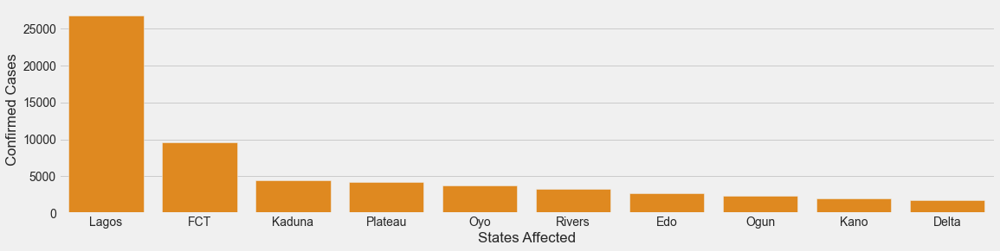

In [62]:
sns.catplot(y= 'Confirmed Cases' , x = 'States Affected', data= plot_data1, kind = 'bar', aspect = 4, height = 4, color= 'darkorange')

In [63]:
plot_data2 = covidnig.sort_values(by= 'Discharged', ascending = False).head(10)

In [64]:
plot_data2

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,26708,2435,24037,236
1,FCT,9627,2840,6694,93
3,Plateau,4262,280,3948,34
2,Kaduna,4504,579,3877,48
4,Oyo,3788,368,3374,46
5,Rivers,3279,232,2987,60
6,Edo,2768,52,2603,113
7,Ogun,2382,174,2175,33
8,Kano,2032,198,1778,56
9,Delta,1843,57,1737,49


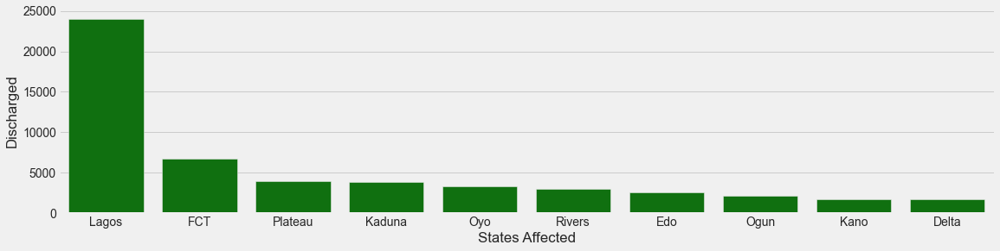

In [65]:
sns.catplot(y= 'Discharged' , x = 'States Affected', data= plot_data2, kind = 'bar', color = 'green', aspect = 4, height = 4)

In [66]:
plot_data3 = covidnig.sort_values(by= 'Deaths', ascending= False).head(10)

In [67]:
plot_data3

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths
0,Lagos,26708,2435,24037,236
6,Edo,2768,52,2603,113
1,FCT,9627,2840,6694,93
5,Rivers,3279,232,2987,60
8,Kano,2032,198,1778,56
9,Delta,1843,57,1737,49
2,Kaduna,4504,579,3877,48
4,Oyo,3788,368,3374,46
10,Ondo,1793,62,1690,41
19,Borno,778,37,705,36


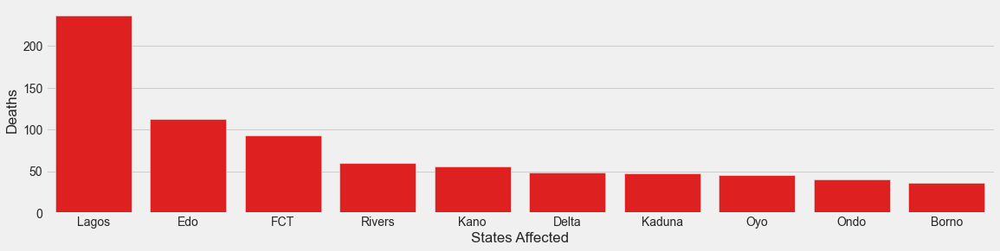

In [68]:
sns.catplot(y= 'Deaths' , x = 'States Affected', data= plot_data3, kind = 'bar', aspect = 4, height = 4, color = 'red')

<AxesSubplot:xlabel='Confirmed Cases', ylabel='States Affected'>

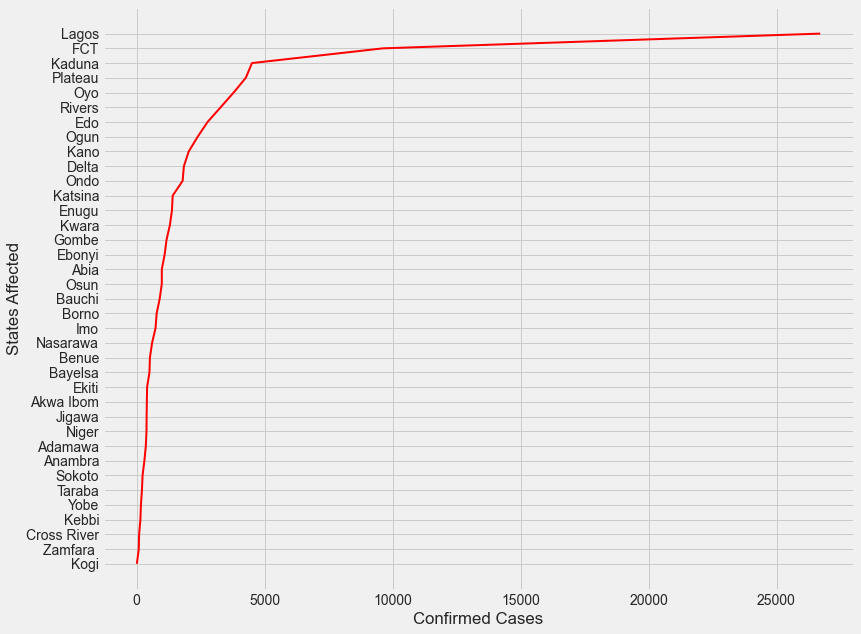

In [69]:
fig = plt.figure(figsize=(12, 10))
sns.lineplot(x = 'Confirmed Cases', y = 'States Affected', data = covidnig, linewidth= 2, color= 'r')

<AxesSubplot:xlabel='Admitted', ylabel='States Affected'>

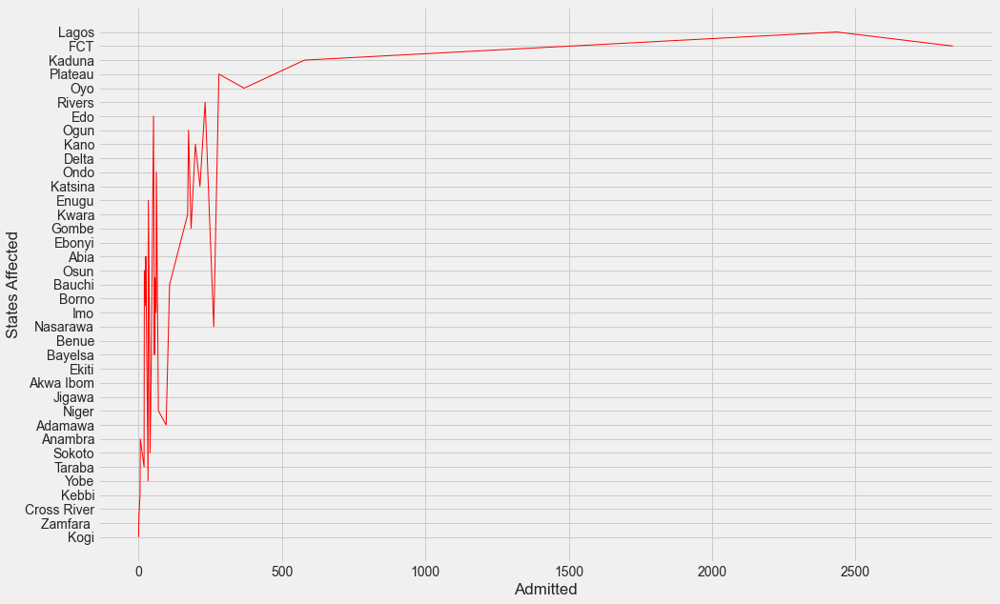

In [70]:
fig = plt.figure(figsize=(15, 10))
sns.lineplot(x = 'Admitted', y = 'States Affected', data = covidnig, linewidth= 1, color= 'r')

<AxesSubplot:xlabel='Discharged', ylabel='States Affected'>

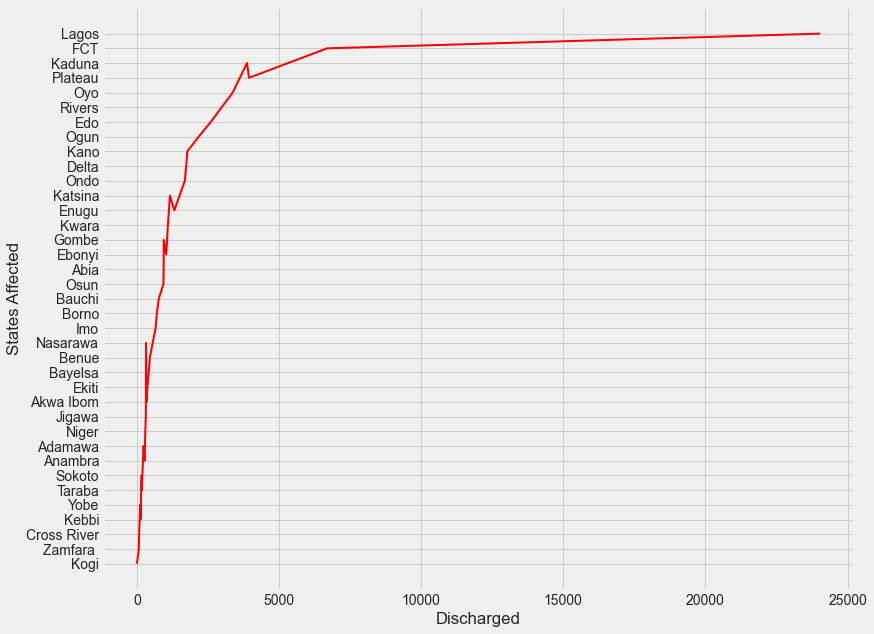

In [71]:
fig = plt.figure(figsize=(12, 10))
sns.lineplot(x = 'Discharged', y = 'States Affected', data = covidnig, linewidth= 2, color= 'r')

<AxesSubplot:xlabel='Deaths', ylabel='States Affected'>

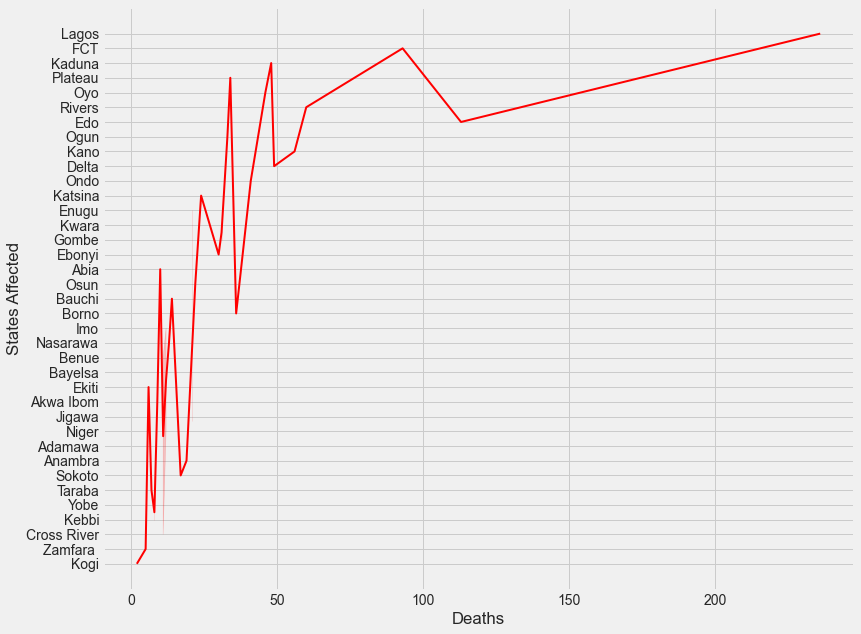

In [72]:
fig = plt.figure(figsize=(12, 10))
sns.lineplot(x = 'Deaths', y = 'States Affected', data = covidnig, linewidth= 2, color= 'r')

In [73]:
plt.figure(figsize = (200, 150))
sns.lineplot(y = 'Dates', x = 'Confirmed', data = tdcn_plot)

<AxesSubplot:xlabel='Confirmed', ylabel='Dates'>

In [74]:
plt.figure(figsize = (200, 150))
sns.lineplot(y = 'Dates', x = 'Recovery', data = tdrn_plot)

<AxesSubplot:xlabel='Recovery', ylabel='Dates'>

In [75]:
plt.figure(figsize = (200, 150))
sns.lineplot(y = 'Dates', x = 'Deaths', data = tddn_plot)

<AxesSubplot:xlabel='Deaths', ylabel='Dates'>

In [76]:
daily_infection_rate = tdcn.diff(axis= 1)

In [77]:
daily_infection_rate

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21
201,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,43.0,35.0,40.0,42.0,37.0,48.0,45.0,63.0,31.0,30.0


In [78]:
daily_infection_rate_plot = daily_infection_rate.melt(var_name = 'Dates', value_name= 'Rate')

In [79]:
daily_infection_rate_plot

,Dates,Rate
0,1/22/20,NaN
1,1/23/20,0.0
2,1/24/20,0.0
3,1/25/20,0.0
4,1/26/20,0.0
...,...,...
490,5/26/21,48.0
491,5/27/21,45.0
492,5/28/21,63.0
493,5/29/21,31.0


In [102]:
plt.figure(figsize = (200, 150))

sns.lineplot(x = 'Rate', y = 'Dates', data = daily_infection_rate_plot)

<AxesSubplot:xlabel='Rate', ylabel='Dates'>

In [81]:
daily_infection_rate_plot.Rate.max()

2464.0

In [82]:
print(daily_infection_rate_plot[daily_infection_rate_plot.Rate == daily_infection_rate_plot.Rate.max()])

       Dates    Rate
367  1/23/21  2464.0


In [83]:
ncdc_and_ex = pd.merge(covidnig, covid_ex, on= 'States Affected')

In [84]:
ncdc_and_ex_plot = ncdc_and_ex.nlargest(10, 'Confirmed Cases')

In [85]:
ncdc_and_ex_plot

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths,region,Population,Overall CCVI Index,Age,Epidemiological,Fragility,Health System,Population Density,Socio-Economic,Transport Availability,Acute IHR
0,Lagos,26708,2435,24037,236,South West,13992000,0.0,0.1,1.0,0.3,0.1,1.0,0.1,0.4,0.93
1,FCT,9627,2840,6694,93,North Central,4865000,0.3,0.0,0.9,0.4,0.6,0.9,0.6,0.2,0.79
2,Kaduna,4504,579,3877,48,North West,9227000,0.7,0.1,0.9,0.8,0.9,0.4,0.6,0.4,0.86
3,Plateau,4262,280,3948,34,North Central,4766000,0.4,0.5,0.4,0.8,0.3,0.3,0.5,0.3,0.93
4,Oyo,3788,368,3374,46,South West,8737000,0.2,0.7,0.8,0.2,0.8,0.6,0.2,0.3,1.06
5,Rivers,3279,232,2987,60,South South,7763000,0.4,0.5,0.9,0.6,0.6,0.9,0.1,0.1,1.00
6,Edo,2768,52,2603,113,South South,4705000,0.1,0.9,0.8,0.1,0.1,0.5,0.4,0.3,1.09
7,Ogun,2382,174,2175,33,South West,5878000,0.3,0.6,0.7,0.5,0.6,0.6,0.0,0.2,1.07
8,Kano,2032,198,1778,56,North West,14726000,0.6,0.2,0.1,0.3,0.4,0.8,0.8,0.5,0.87
9,Delta,1843,57,1737,49,South South,6303000,0.4,0.6,0.7,0.2,1.0,0.6,0.5,0.4,1.08


In [86]:
ncdc_and_ex_plot.sort_values('Confirmed Cases', ascending= False)

,States Affected,Confirmed Cases,Admitted,Discharged,Deaths,region,Population,Overall CCVI Index,Age,Epidemiological,Fragility,Health System,Population Density,Socio-Economic,Transport Availability,Acute IHR
0,Lagos,26708,2435,24037,236,South West,13992000,0.0,0.1,1.0,0.3,0.1,1.0,0.1,0.4,0.93
1,FCT,9627,2840,6694,93,North Central,4865000,0.3,0.0,0.9,0.4,0.6,0.9,0.6,0.2,0.79
2,Kaduna,4504,579,3877,48,North West,9227000,0.7,0.1,0.9,0.8,0.9,0.4,0.6,0.4,0.86
3,Plateau,4262,280,3948,34,North Central,4766000,0.4,0.5,0.4,0.8,0.3,0.3,0.5,0.3,0.93
4,Oyo,3788,368,3374,46,South West,8737000,0.2,0.7,0.8,0.2,0.8,0.6,0.2,0.3,1.06
5,Rivers,3279,232,2987,60,South South,7763000,0.4,0.5,0.9,0.6,0.6,0.9,0.1,0.1,1.00
6,Edo,2768,52,2603,113,South South,4705000,0.1,0.9,0.8,0.1,0.1,0.5,0.4,0.3,1.09
7,Ogun,2382,174,2175,33,South West,5878000,0.3,0.6,0.7,0.5,0.6,0.6,0.0,0.2,1.07
8,Kano,2032,198,1778,56,North West,14726000,0.6,0.2,0.1,0.3,0.4,0.8,0.8,0.5,0.87
9,Delta,1843,57,1737,49,South South,6303000,0.4,0.6,0.7,0.2,1.0,0.6,0.5,0.4,1.08


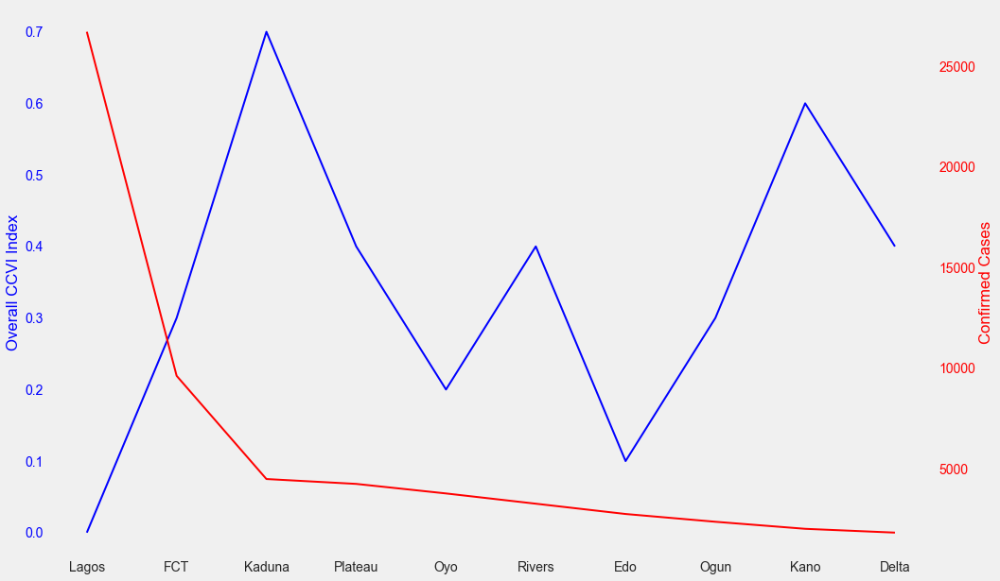

In [87]:

fig = plt.figure(figsize= (15, 10))
ax1 = fig.add_subplot(111)
ax1.plot(ncdc_and_ex_plot['States Affected'], ncdc_and_ex_plot['Overall CCVI Index'], 'b-', linewidth= 2)
ax1.set_ylabel('Overall CCVI Index', color= 'b')
for tl in ax1.get_yticklabels():
    tl.set_color('b')
plt.grid(False)

ax2 = ax1.twinx()
ax2.plot(ncdc_and_ex_plot['States Affected'], ncdc_and_ex_plot['Confirmed Cases'], 'r-', linewidth= 2)
ax2.set_ylabel('Confirmed Cases', color='r')
for tl in ax2.get_yticklabels():
    tl.set_color('r')
plt.grid(False)

<AxesSubplot:xlabel='Confirmed Cases', ylabel='Population Density'>

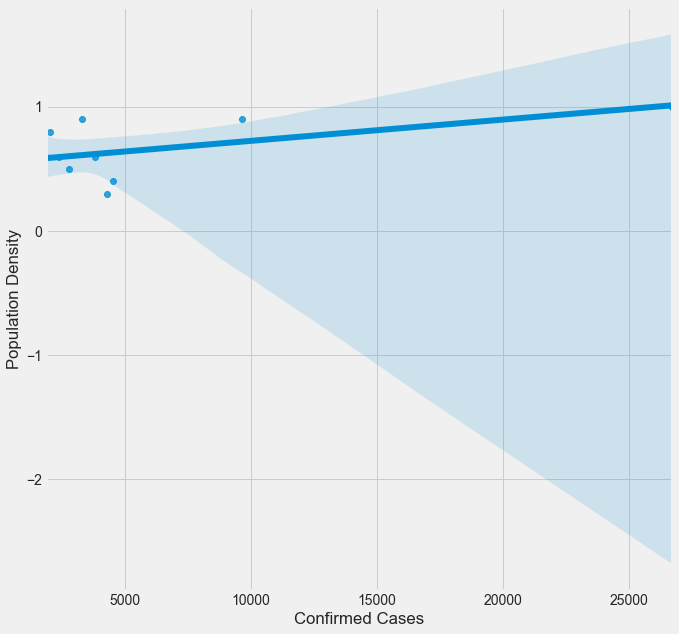

In [88]:
plt.figure(figsize=(10,10))
sns.regplot(x= 'Confirmed Cases', y= 'Population Density', data= ncdc_and_ex_plot)

* It can be deduced from the regression line drawn above that there is a possitive correlation between the population desntity and the Confirmed Cases. This shows that the more the number of people in a given space, the higher the rate of transmission if anyone comes in contact with an infected person. this is the reason the impoertance of social distancing could not be overemphasized.

* However, the fact that the correclation is not a strong one, tells us that there are other factors involved as regards the the high number of confirmed cases.

<AxesSubplot:xlabel='Health System', ylabel='Deaths'>

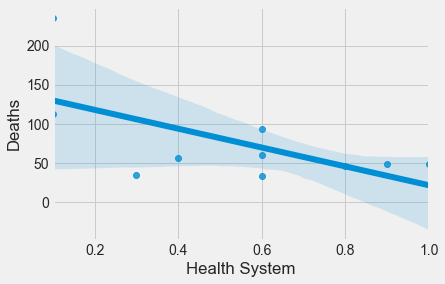

In [89]:
sns.regplot(x= 'Health System', y= 'Deaths', data = ncdc_and_ex_plot)

It can be seen from the above figure that inadequate health care plays a huge role is reducing the number of deaths. There is a better chance of survival when a patience is admitted to a well-equiped health care facility.



<AxesSubplot:xlabel='Confirmed Cases', ylabel='Socio-Economic'>

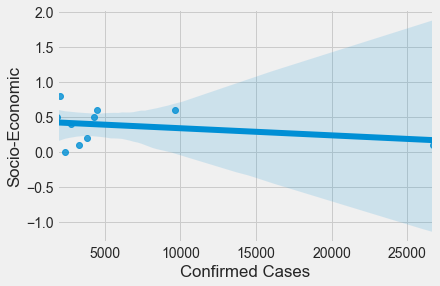

In [90]:
sns.regplot(x= 'Confirmed Cases', y= 'Socio-Economic', data = ncdc_and_ex_plot)

We can see from the above plot that the higher the average socio-economic class of a state, the lower the number of cases. 

To give a few practical examples:
Car owners are less likely to contract the disease than people who use comercial transport.

People who own smart devices are better informed about preventive measures that people don't and people who get informed through word of mouth; and the list goes on.

<AxesSubplot:xlabel='Acute IHR', ylabel='Deaths'>

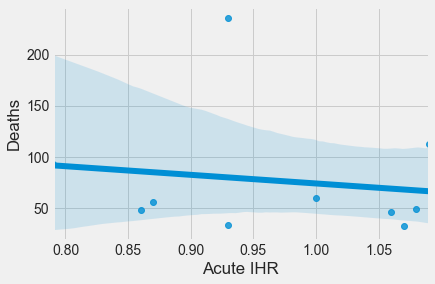

In [91]:
sns.regplot(x= 'Acute IHR', y= 'Deaths', data = ncdc_and_ex_plot)

With the above plot showing a negative correlation between 'Acute IHR' and 'Deaths', it is evident that a country must adhere to the International Health Regulations provided and also, health organisations must be encouraged to do better to improve these regulations and save more lives.

In [92]:
realgdp

,Year,Q1,Q2,Q3,Q4
0,2014-01-01,15438679.50,16084622.31,17479127.58,18150356.45
1,2015-01-01,16050601.38,16463341.91,17976234.59,18533752.07
2,2016-01-01,15943714.54,16218542.41,17555441.69,18213537.29
3,2017-01-01,15797965.83,16334719.27,17760228.17,18598067.07
4,2018-01-01,16096654.19,16580508.07,18081342.10,19041437.59
5,2019-01-01,16434552.65,16931434.89,18494114.17,19530000.00
6,2020-01-01,16740000.00,15890000.00,17820000.00,0.00


In [93]:
realgdp.iloc[0, 1:5].sum()

67152785.84

In [94]:
realgdp.describe()

,Q1,Q2,Q3,Q4
count,7.000000e+00,7.000000e+00,7.000000e+00,7.000000e+00
mean,1.607174e+07,1.635760e+07,1.788093e+07,1.600959e+07
std,4.225676e+05,3.423407e+05,3.442170e+05,7.075830e+06
min,1.543868e+07,1.589000e+07,1.747913e+07,0.000000e+00
25%,1.587084e+07,1.615158e+07,1.765783e+07,1.818195e+07
50%,1.605060e+07,1.633472e+07,1.782000e+07,1.853375e+07
75%,1.626560e+07,1.652192e+07,1.802879e+07,1.881975e+07
max,1.674000e+07,1.693143e+07,1.849411e+07,1.953000e+07


In [95]:
pandemic_impact_plot = pd.melt(realgdp, id_vars= ['Year'], value_vars= ['Q1', 'Q2', 'Q3', 'Q4'], var_name= 'Quaters', value_name= 'GDP')

In [96]:
pandemic_impact_plot['Year'] = pandemic_impact_plot['Year'].dt.year

In [97]:
pandemic_impact_plot.head(3)

,Year,Quaters,GDP
0,2014,Q1,15438679.50
1,2015,Q1,16050601.38
2,2016,Q1,15943714.54


In [98]:
pandemic_impact_plot.sort_values('GDP')

,Year,Quaters,GDP
27,2020,Q4,0.00
0,2014,Q1,15438679.50
3,2017,Q1,15797965.83
13,2020,Q2,15890000.00
2,2016,Q1,15943714.54
1,2015,Q1,16050601.38
7,2014,Q2,16084622.31
4,2018,Q1,16096654.19
9,2016,Q2,16218542.41
10,2017,Q2,16334719.27


In [99]:
pandemic_impact_plot.describe()

,Year,GDP
count,28.0000,2.800000e+01
mean,2017.0000,1.657996e+07
std,2.0367,3.438177e+06
min,2014.0000,0.000000e+00
25%,2015.0000,1.609365e+07
50%,2017.0000,1.683572e+07
75%,2019.0000,1.809860e+07
max,2020.0000,1.953000e+07


In [100]:
pandemic_impact_plot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Year     28 non-null     int64  
 1   Quaters  28 non-null     object 
 2   GDP      28 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 800.0+ bytes


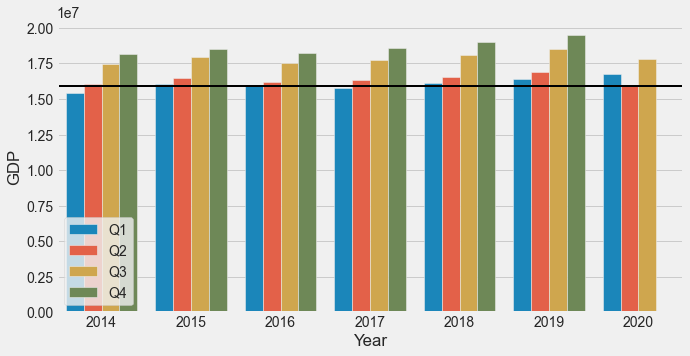

In [101]:
plt.figure(figsize= (10,5))
sns.barplot(x='Year', y='GDP',hue= 'Quaters', data = pandemic_impact_plot)
plt.legend(loc= 'lower left')
plt.axhline(y = 15890000.00, linewidth = 2, color = 'black')

Nigeria's GDP in the first quater of 2020 was the highest of all first quaters since 2014 but the positive momentum was impeeded due to the impact of the COVID-19 outbreak who's effect is seen in the second quater of the year 2020 which also corresponds with the lockdown period.

The 2020 Q2 was the first time Nigerias GDP didn't increase on a quaterly basis since 2014 and is also recorded as the 3rd least GDP since 2014(with data for 2020 Q4 yet to be collated/recorded).

## CONCLUSION

This project was carried out to analyze the general impact of the covid-19 outbreak on Nigeria; ranging from the number of confirmed cases, admissions, discharges and deaths recorded around the 36 states and Federal Capital Teritory in Nigeria.

The economic Impact of the pandemic was also analyzed, with Nigeria seeing a decline in its real gdp in the second quater of the year 2020 as a result of the lockdown. from the analysis provided, it was shown that Nigeria failed to maintain its quaterly gdp uptrend for the first time since 2014 in the year 2020 with the real gdp of the 2nd quater being significantly less than that of the first quater.

Some other factors which contributed to the spread of the virus were also analyzed ranging from the total population, population indeces, socia-economic factors etc from the various states in nigeria. These analysis was carried from combined datasets.

Detailed plots were provided for easy visualization and understanding of anaylytical findings in this project. 

Through this analysis, a lot of key 'what', 'why', 'when' questions have been answered.